# Data Preparation: Hurricane analysis, part 1/3


> * 🔬 Data Science
* 🚀 Data Exploration and Cleaning
* 🖥️ Computation-intensive operation, uses GeoAnalytics desktop tools
* 👟 Ready To Run!

Adapted from the [original sample notebook](https://www.arcgis.com/home/item.html?id=9013073ea5a545e2852f09eb1cfccd60) published under the same title by Esri in ArcGIS Online.

Hurricanes are large swirling storms that produce winds of speeds `74` miles per hour (`119` kmph) or higher. When hurricanes make a landfall, they produce heavy rainfall, and cause storm surges and intense flooding. Often hurricanes strike places that are dense in population, causing devastating amounts of death and destruction throughout the world.

***Disclaimer:*** *the data processing and analyes presented in this notebook are for demonstration purposes only.*

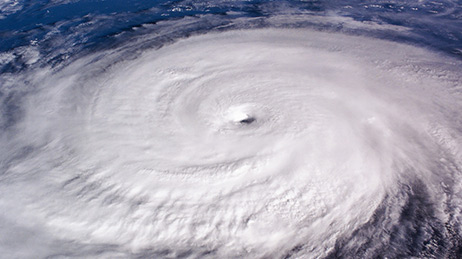

Since the recent past, agencies such as the [National Hurricane Center](https://www.nhc.noaa.gov/aboutintro.shtml) have been collecting quantitative data about hurricanes. In this study you will use meteorological data of hurricanes recorded over a period of `176` years to analyze their location, intensity and investigate if there are any statistically significant trends. You also will analyze the places most affected by hurricanes and what their demographic make up is, and conclude by citing relevant articles that draw similar conclusions.

<h1>**Table of Contents**<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Part-1---prepare-hurricane-data" data-toc-modified-id="Part-1---prepare-hurricane-data-1">Part 1 - prepare hurricane data</a></span></li><li><span><a href="#Download-hurricane-data-from-NCEI-FTP-portal" data-toc-modified-id="Download-hurricane-data-from-NCEI-FTP-portal-2">Download hurricane data from NCEI FTP portal</a></span><ul class="toc-item"><li><span><a href="#Setup-data-paths" data-toc-modified-id="Setup-data-paths-2.1">Setup data paths</a></span></li><li><span><a href="#Download-each-file-into-the-hurricanes_raw-directory" data-toc-modified-id="Download-each-file-into-the-hurricanes_raw-directory-2.2">Download each file into the <code>hurricanes_raw</code> directory</a></span><ul class="toc-item"><li><span><a href="#Extract-source-data-files-from-an-archive" data-toc-modified-id="Extract-source-data-files-from-an-archive-2.2.1">Extract source data files from an archive</a></span></li></ul></li></ul></li><li><span><a href="#Process-CSV-files-by-removing-header-rows" data-toc-modified-id="Process-CSV-files-by-removing-header-rows-3">Process CSV files by removing header rows</a></span><ul class="toc-item"><li><span><a href="#Automate-across-all-files" data-toc-modified-id="Automate-across-all-files-3.1">Automate across all files</a></span></li></ul></li><li><span><a href="#Read-input-CSV-data" data-toc-modified-id="Read-input-CSV-data-4">Read input CSV data</a></span></li><li><span><a href="#Merge-all-location-columns" data-toc-modified-id="Merge-all-location-columns-5">Merge all location columns</a></span></li><li><span><a href="#Merge-similar-columns" data-toc-modified-id="Merge-similar-columns-6">Merge similar columns</a></span><ul class="toc-item"><li><span><a href="#Merge-wind-columns" data-toc-modified-id="Merge-wind-columns-6.1">Merge wind columns</a></span><ul class="toc-item"><li><span><a href="#Merge-pressure-columns" data-toc-modified-id="Merge-pressure-columns-6.1.1">Merge pressure columns</a></span></li><li><span><a href="#Merge-grade-columns" data-toc-modified-id="Merge-grade-columns-6.1.2">Merge grade columns</a></span></li><li><span><a href="#Merge-eye-diameter-columns" data-toc-modified-id="Merge-eye-diameter-columns-6.1.3">Merge eye diameter columns</a></span></li></ul></li><li><span><a href="#Identify-remaining-redundant-columns" data-toc-modified-id="Identify-remaining-redundant-columns-6.2">Identify remaining redundant columns</a></span></li><li><span><a href="#Drop-all-redundant-columns" data-toc-modified-id="Drop-all-redundant-columns-6.3">Drop all redundant columns</a></span></li></ul></li><li><span><a href="#Perform-delayed-computation" data-toc-modified-id="Perform-delayed-computation-7">Perform delayed computation</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Extract-pre-processed-files-with-merged-columns-from-an-archive" data-toc-modified-id="Extract-pre-processed-files-with-merged-columns-from-an-archive-7.0.1">Extract pre-processed files with merged columns from an archive</a></span></li><li><span><a href="#Final-data-preparation-steps" data-toc-modified-id="Final-data-preparation-steps-7.0.2">Final data preparation steps</a></span></li></ul></li></ul></li><li><span><a href="#Create-a-time-enabled-feature-layer" data-toc-modified-id="Create-a-time-enabled-feature-layer-8">Create a time enabled feature layer</a></span><ul class="toc-item"><li><span><a href="#Prepare-a-time-enabled-layer" data-toc-modified-id="Prepare-a-time-enabled-layer-8.1">Prepare a time-enabled layer</a></span></li></ul></li><li><span><a href="#Execute-reconstruct-tracks-tool" data-toc-modified-id="Execute-reconstruct-tracks-tool-9">Execute reconstruct tracks tool</a></span><ul class="toc-item"><li><span><a href="#Extract-a-copy-of-completed-data" data-toc-modified-id="Extract-a-copy-of-completed-data-9.1">Extract a copy of completed data</a></span></li><li><span><a href="#Inspect-the-results-of-aggregation" data-toc-modified-id="Inspect-the-results-of-aggregation-9.2">Inspect the results of aggregation</a></span></li></ul></li></ul></div>

## Part 1 - prepare hurricane data
This notebook covers part 1 of this study. In this notebook, you will:

  - download data from the National Centers for Environmental Information (NCEI) portal
  - do extensive pre-processing in the form of clearing headers, merging redundant columns
  - aggregate the observations into hurricane tracks.

## Download hurricane data from NCEI FTP portal
The [National Centers for Environmental Information](https://www.ncdc.noaa.gov/), formerly [National Climatic Data Center](https://www.ncdc.noaa.gov/) shares the historic hurricane track datasets at [ftp://eclipse.ncdc.noaa.gov/pub/ibtracs/v03r09/all/csv/](ftp://eclipse.ncdc.noaa.gov/pub/ibtracs/v03r09/all/csv/). You can use the `ftplib` Python library to login in and download these datasets.

In [1]:
# imports for downloading data from FTP site
import os
from ftplib import FTP

# imports to process data using Dask
from dask import delayed
import dask.dataframe as ddf

# imports for data analysis and visualization
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# import modules for the ArcGIS API for Python
from arcgis.gis import GIS
from arcgis.features import GeoAccessor, GeoSeriesAccessor

# import arcpy
import arcpy

# miscellaneous imports
from pprint import pprint
from copy import deepcopy
from zipfile import ZipFile
import shutil

# enable overwrite in the ArcPy environment
arcpy.env.overwriteOutput = True

### Setup data paths

*Note: update the `data_dir` path to point to the location where you extracted the files for this workshop.*

In [2]:
data_dir = 'D:/arcgis_notebooks/hurricane_analysis/data'
hurricanes_raw_dir = os.path.join(data_dir,'hurricanes_raw')
hurricanes_cleaned_dir = os.path.join(data_dir,'hurricanes_cleaned')
hurricanes_merged_dir = os.path.join(data_dir, 'hurricanes_merged')

Create folders for data files that will be used in this tutorial, if they do not already exist:

In [3]:
if 'hurricanes_raw' not in os.listdir(data_dir):
    os.mkdir(os.path.join(data_dir,'hurricanes_raw'))

if 'hurricanes_cleaned' not in os.listdir(data_dir):
    os.mkdir(os.path.join(data_dir,'hurricanes_cleaned'))

if 'hurricanes_merged' not in os.listdir(data_dir):
    os.mkdir(os.path.join(data_dir,'hurricanes_merged'))

os.listdir(data_dir)

['hurricanes.gdb.part1.zip',
 'hurricanes.gdb.part2.zip',
 'hurricanes_cleaned',
 'hurricanes_merged',
 'hurricanes_merged.csv.zip',
 'hurricanes_raw',
 'hurricanes_raw.zip',
 'hurricane_points_time_enabled.lyrx',
 'hurricane_points_time_enabled_template.lyrx',
 'schema.ini']

### Download each file into the `hurricanes_raw` directory

***Note:*** *this code is here for reference, and commented-out.  For the purposes of this tutorial, you may instead extract a copy of the files provided in a zip file.  If you wish to start from scratch, uncomment and execute the code in the following cells.*

Establish an anonymous connection to FTP site.

In [4]:
# conn = FTP(host='eclipse.ncdc.noaa.gov')
# conn.login()

'230 Anonymous access granted, restrictions apply'

Change directory to folder containing the hurricane files. List the files.

In [5]:
# conn.cwd('/pub/ibtracs/v03r10/all/csv/year/')
# file_list = conn.nlst()
# len(file_list)

176

Print the top 10 items.

In [6]:
# file_list[:10]

['Year.1842.ibtracs_all.v03r10.csv',
 'Year.1843.ibtracs_all.v03r10.csv',
 'Year.1844.ibtracs_all.v03r10.csv',
 'Year.1845.ibtracs_all.v03r10.csv',
 'Year.1846.ibtracs_all.v03r10.csv',
 'Year.1847.ibtracs_all.v03r10.csv',
 'Year.1848.ibtracs_all.v03r10.csv',
 'Year.1849.ibtracs_all.v03r10.csv',
 'Year.1850.ibtracs_all.v03r10.csv',
 'Year.1851.ibtracs_all.v03r10.csv']

Now download all data from 1842-2017 (this might take around 15 mins or more depending on your Internet connection).

In [8]:
# for file in file_list:
#     with open(os.path.join(hurricanes_raw_dir, file), 'wb') as file_handle:
#         try:
#             conn.retrbinary('RETR ' + file, file_handle.write, 1024)
#             print(f'Downloaded {file}')
        
#         except Exception as download_ex:
#             print(f'Error downloading {file} + {str(download_ex)}')

Downloaded Year.1842.ibtracs_all.v03r10.csv
Downloaded Year.1843.ibtracs_all.v03r10.csv
Downloaded Year.1844.ibtracs_all.v03r10.csv
Downloaded Year.1845.ibtracs_all.v03r10.csv
Downloaded Year.1846.ibtracs_all.v03r10.csv
...
Downloaded Year.2013.ibtracs_all.v03r10.csv
Downloaded Year.2014.ibtracs_all.v03r10.csv
Downloaded Year.2015.ibtracs_all.v03r10.csv
Downloaded Year.2016.ibtracs_all.v03r10.csv
Downloaded Year.2017.ibtracs_all.v03r10.csv


#### Extract source data files from an archive

Instead of downloading ~500mb of data, if there are no files found in the `hurricanes_raw_dir` folder, then the following code will extract a copy of the data that was previously downloaded and provided in the `hurricanes_raw.zip` archive included in the files for this tutorial.

In [4]:
hurricanes_raw_zip = os.path.join(data_dir, "hurricanes_raw.zip")

if not os.listdir(hurricanes_raw_dir):
    with ZipFile(hurricanes_raw_zip) as z:
        z.extractall(data_dir)

os.listdir(hurricanes_raw_dir)[:10]

['Year.1842.ibtracs_all.v03r10.csv',
 'Year.1843.ibtracs_all.v03r10.csv',
 'Year.1844.ibtracs_all.v03r10.csv',
 'Year.1845.ibtracs_all.v03r10.csv',
 'Year.1846.ibtracs_all.v03r10.csv',
 'Year.1847.ibtracs_all.v03r10.csv',
 'Year.1848.ibtracs_all.v03r10.csv',
 'Year.1849.ibtracs_all.v03r10.csv',
 'Year.1850.ibtracs_all.v03r10.csv',
 'Year.1851.ibtracs_all.v03r10.csv']

## Process CSV files by removing header rows
The CSV files have multiple header rows. Let us start by processing one of the files as an example.

In [5]:
csv_path = os.path.join(hurricanes_raw_dir,'Year.2017.ibtracs_all.v03r10.csv')
df = pd.read_csv(csv_path)
df.head()

IBTrACS -- Version: v03r10
Serial_Num    Season Num Basin Sub_basin Name   ISO_time            Nature Latitude  Longitude Wind(WMO) Pres(WMO) Center Wind(WMO) Percentile Pres(WMO) Percentile Track_type Latitude_for_mapping Longitude_for_mapping Current Basin hurdat_atl_lat hurdat_atl_lon hurdat_atl_grade hurdat_atl_wind hurdat_atl_pres td9636_lat td9636_lon td9636_grade td9636_wind td9636_pres reunion_lat reunion_lon reunion_grade reunion_wind reunion_pres atcf_lat  atcf_lon atcf_grade atcf_wind atcf_pres mlc_natl_lat mlc_natl_lon mlc_natl_grade mlc_natl_wind mlc_natl_pres ds824_sh_lat ds824_sh_lon ds824_sh_grade ds824_sh_wind ds824_sh_pres ds824_ni_lat ds824_ni_lon ds824_ni_grade ds824_ni_wind ds824_ni_pres bom_lat   bom_lon  bom_grade bom_wind bom_pres ds824_au_lat ds824_au_lon ds824_au_grade ds824_au_wind ds824_au_pres jtwc_sh_lat jtwc_sh_lon jtwc_sh_grade jtwc_sh_wind jtwc_sh_pres jtwc_wp_lat jtwc_wp_lon jtwc_wp_grade jtwc_wp_wind jtwc_wp_pres td9635_lat td9635_lon td9635_grade td9635_wind td9635_pres ds824_wp_lat ds824_wp_lon ds824_wp_grade ds824_wp_wind ds824_wp_pres jtwc_io_lat jtwc_io_lon jtwc_io_grade jtwc_io_wind jtwc_io_pres cma_lat   cma_lon  cma_grade cma_wind cma_pres hurdat_epa_lat hurdat_epa_lon hurdat_epa_grade hurdat_epa_wind hurdat_epa_pres jtwc_ep_lat jtwc_ep_lon jtwc_ep_grade jtwc_ep_wind jtwc_ep_pres ds824_ep_lat ds824_ep_lon ds824_ep_grade ds824_ep_wind ds824_ep_pres jtwc_cp_lat jtwc_cp_lon jtwc_cp_grade jtwc_cp_wind jtwc_cp_pres tokyo_lat tokyo_lon tokyo_grade tokyo_wind tokyo_pres neumann_lat neumann_lon neumann_grade neumann_wind neumann_pres hko_lat   hko_lon  hko_grade hko_wind hko_pres cphc_lat  cphc_lon cphc_grade cphc_wind cphc_pres wellington_lat wellington_lon wellington_grade wellington_wind wellington_pres newdelhi_lat newdelhi_lon newdelhi_grade newdelhi_wind newdelhi_pres nadi_lat  nadi_lon nadi_grade nadi_wind nadi_pres reunion_rmw reunion_wind_radii_1_ne reunion_wind_radii_1_se reunion_wind_radii_1_sw reunion_wind_radii_1_nw reunion_wind_radii_2_ne reunion_wind_radii_2_se reunion_wind_radii_2_sw reunion_wind_radii_2_nw bom_mn_hurr_xtnt bom_mn_gale_xtnt bom_mn_eye_diam bom_roci atcf_rmw atcf_poci atcf_roci atcf_eye atcf_wrad34_rad1 atcf_wrad34_rad2 atcf_wrad34_rad3 atcf_wrad34_rad4 atcf_wrad50_rad1 atcf_wrad50_rad2 atcf_wrad50_rad3 atcf_wrad50_rad4 atcf_wrad64_rad1 atcf_wrad64_rad2 atcf_wrad64_rad3 atcf_wrad64_rad4 tokyo_dir50 tokyo_long50 tokyo_short50 tokyo_dir30 tokyo_long30 tokyo_short30 jtwc_??_rmw jtwc_??_poci jtwc_??_roci jtwc_??_eye jtwc_??_wrad34_rad1 jtwc_??_wrad34_rad2 jtwc_??_wrad34_rad3 jtwc_??_wrad34_rad4 jtwc_??_wrad50_rad1 jtwc_??_wrad50_rad2 jtwc_??_wrad50_rad3 jtwc_??_wrad50_rad4 jtwc_??_wrad64_rad1 jtwc_??_wrad64_rad2 jtwc_??_wrad64_rad3        jtwc_??_wrad64_rad4
NaN           Year   #   BB    BB        NaN    YYYY-MM-DD HH:MM:SS NaN    deg_north deg_east  kt        mb        NaN    %                    %                    NaN        degrees_north        degrees_east          NaN           deg_north      deg_east                        kt              mb              deg_north  deg_east                kt          mb          deg_north   deg_east                  kt           mb           deg_north deg_east            kt        mb        deg_north    deg_east                    kt            mb            deg_north    deg_east                    kt            mb            deg_north    deg_east                    kt            mb            deg_north deg_east           kt       mb       deg_north    deg_east                    kt            mb            deg_north   deg_east                  kt           mb           deg_north   deg_east                  kt           mb           deg_north  deg_east                kt          mb          deg_north    deg_east                    kt            mb            deg_north   deg_east                  kt           mb           deg_north deg_east           kt       mb       deg_north      deg_east                        kt       

The input looks mangled. This is because the file's first row has a header that pandas fails to read. So let's skip that row.

In [7]:
df = pd.read_csv(csv_path, skiprows=1)
df.head()

,Serial_Num,Season,Num,Basin,Sub_basin,Name,ISO_time,Nature,Latitude,Longitude,...,jtwc_??_wrad34_rad3,jtwc_??_wrad34_rad4,jtwc_??_wrad50_rad1,jtwc_??_wrad50_rad2,jtwc_??_wrad50_rad3,jtwc_??_wrad50_rad4,jtwc_??_wrad64_rad1,jtwc_??_wrad64_rad2,jtwc_??_wrad64_rad3,jtwc_??_wrad64_rad4
0,NaN,Year,#,BB,BB,NaN,YYYY-MM-DD HH:MM:SS,NaN,deg_north,deg_east,...,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile
1,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 06:00:00,NR,-10.5,129.50,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00
2,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 12:00:00,NR,-11.0,129.00,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00
3,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 18:00:00,NR,-11.4,129.33,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00
4,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 21:00:00,NR,-11.6,129.40,...,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0


A little better. But the file's 3rd row also contains extra header information. Let's drop that row.

In [8]:
df.drop(labels=0, axis=0, inplace=True)
df.head()

,Serial_Num,Season,Num,Basin,Sub_basin,Name,ISO_time,Nature,Latitude,Longitude,...,jtwc_??_wrad34_rad3,jtwc_??_wrad34_rad4,jtwc_??_wrad50_rad1,jtwc_??_wrad50_rad2,jtwc_??_wrad50_rad3,jtwc_??_wrad50_rad4,jtwc_??_wrad64_rad1,jtwc_??_wrad64_rad2,jtwc_??_wrad64_rad3,jtwc_??_wrad64_rad4
1,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 06:00:00,NR,-10.5,129.50,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00
2,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 12:00:00,NR,-11.0,129.00,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00
3,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 18:00:00,NR,-11.4,129.33,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00
4,2016353S11130,2017,01,SI,WA,NONAME,2016-12-18 21:00:00,NR,-11.6,129.40,...,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0
5,2016353S11130,2017,01,SI,WA,NONAME,2016-12-19 00:00:00,NR,-11.6,129.30,...,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00,-999.00


### Automate across all files
Now you need to repeat the above cleaning steps across all CSV files. In the steps below, you will read all CSV files, drop the headers, and write to disk. This step is necessary as it will ease subsequent processing that uses the Dask library.

*Note: you could overwrite the files in the `hurricanes_raw` folder (e.g., to conserve disk space), but in these steps you will ouput the files to a different folder called `hurricanes_cleaned` so that you can easily re-run these steps if needed without having to download the original CSV files again.*

In [9]:
num_records = {}
for file in os.listdir(hurricanes_raw_dir):
    df = pd.read_csv(os.path.join(hurricanes_raw_dir, file), skiprows=1)
    num_records[str(file.split('.')[1])] = df.shape[0]
    
    df.drop(labels=0, axis=0, inplace=True)
    df.to_csv(os.path.join(hurricanes_cleaned_dir, file), index=False)
    print(f'Processed {file}')

Processed Year.1842.ibtracs_all.v03r10.csv
Processed Year.1843.ibtracs_all.v03r10.csv
Processed Year.1844.ibtracs_all.v03r10.csv
Processed Year.1845.ibtracs_all.v03r10.csv
Processed Year.1846.ibtracs_all.v03r10.csv
Processed Year.1847.ibtracs_all.v03r10.csv
Processed Year.1848.ibtracs_all.v03r10.csv
Processed Year.1849.ibtracs_all.v03r10.csv
Processed Year.1850.ibtracs_all.v03r10.csv
Processed Year.1851.ibtracs_all.v03r10.csv
Processed Year.1852.ibtracs_all.v03r10.csv
Processed Year.1853.ibtracs_all.v03r10.csv
Processed Year.1854.ibtracs_all.v03r10.csv
Processed Year.1855.ibtracs_all.v03r10.csv
Processed Year.1856.ibtracs_all.v03r10.csv
Processed Year.1857.ibtracs_all.v03r10.csv
Processed Year.1858.ibtracs_all.v03r10.csv
Processed Year.1859.ibtracs_all.v03r10.csv
Processed Year.1860.ibtracs_all.v03r10.csv
Processed Year.1861.ibtracs_all.v03r10.csv
Processed Year.1862.ibtracs_all.v03r10.csv
Processed Year.1863.ibtracs_all.v03r10.csv
Processed Year.1864.ibtracs_all.v03r10.csv
Processed Y

C:\Users\mleahy\AppData\Local\ESRI\conda\envs\arcgis-notebooks\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (1,2,8,9,10,11,13,14,16,17,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Processed Year.1971.ibtracs_all.v03r10.csv
Processed Year.1972.ibtracs_all.v03r10.csv
Processed Year.1973.ibtracs_all.v03r10.csv
Processed Year.1974.ibtracs_all.v03r10.csv
Processed Year.1975.ibtracs_all.v03r10.csv
Processed Year.1976.ibtracs_all.v03r10.csv
Processed Year.1977.ibtracs_all.v03r10.csv
Processed Year.1978.ibtracs_all.v03r10.csv
Processed Year.1979.ibtracs_all.v03r10.csv
Processed Year.1980.ibtracs_all.v03r10.csv
Processed Year.1981.ibtracs_all.v03r10.csv
Processed Year.1982.ibtracs_all.v03r10.csv
Processed Year.1983.ibtracs_all.v03r10.csv
Processed Year.1984.ibtracs_all.v03r10.csv
Processed Year.1985.ibtracs_all.v03r10.csv
Processed Year.1986.ibtracs_all.v03r10.csv
Processed Year.1987.ibtracs_all.v03r10.csv
Processed Year.1988.ibtracs_all.v03r10.csv
Processed Year.1989.ibtracs_all.v03r10.csv
Processed Year.1990.ibtracs_all.v03r10.csv
Processed Year.1991.ibtracs_all.v03r10.csv
Processed Year.1992.ibtracs_all.v03r10.csv
Processed Year.1993.ibtracs_all.v03r10.csv
Processed Y

# Cleaning hurricane observations with Dask
The data collected from NOAA NCDC source is just too large to clean with Pandas or Excel. With a dense matrix of `350,000` rows x by `200` columns, this dataset is a large amount of memory for a normal computer. Hence traditional packages such as Pandas may not work, as they require the data to fit fully in memory.

Thus, in this part of the study, you will use use **[Dask](https://dask.org/)**, a distributed data analysis library. Functionally, Dask provides a `DataFrame` object that behaves similar to a traditional pandas `DataFrame` object. You can perform slicing, dicing, and exploration on them. However transformative operations on the `DataFrame` get queued and are operated only when necessary. When executed, Dask will read data in chunks, distribute it to workers (multiple cores on a single machine or multiple machines in a cluster) and collect the data back for you. Thus, Dask allows you to work with any larger-than-memory dataset as it performs operations on chunks of it in a distributed manner.

## Read input CSV data
As mentioned earlier, Dask allows you to work with larger than memory datasets. These datasets can reside as one large file or as multiple files in a folder. For the latter, Dask allows you to specify as input either a list of file paths or a [globstring](https://en.wikipedia.org/wiki/Glob_(programming)) that matches multiple datasets, for example by using the `*` wildcard. In return, it provides you with a single `DataFrame` object that represents all your datasets combined together. The operations you perform on this `DataFrame` get queued and executed only when necessary.

*Note: to minimize the processing time in later steps, you may choose to limit the files with a more specific filename pattern, like* `'Year.20*.csv'` *- a complete copy of the data produced by these steps can be extracted from a zip archive provided in the tutorials files, noted at the end of this notebook.*

In [12]:
csv_path = os.path.join(hurricanes_cleaned_dir,'*.csv')

Preemptively, specify the assortment of values that should be treated as null values.

In [13]:
table_na_values=['-999.','-999','-999.000']
full_df = ddf.read_csv(csv_path, na_values=table_na_values, dtype={'Center': 'object'})

You can query a few records just as you might do with a regular Pandas `DataFrame` object.

In [14]:
full_df.head()

,Serial_Num,Season,Num,Basin,Sub_basin,Name,ISO_time,Nature,Latitude,Longitude,...,jtwc_??_wrad34_rad3,jtwc_??_wrad34_rad4,jtwc_??_wrad50_rad1,jtwc_??_wrad50_rad2,jtwc_??_wrad50_rad3,jtwc_??_wrad50_rad4,jtwc_??_wrad64_rad1,jtwc_??_wrad64_rad2,jtwc_??_wrad64_rad3,jtwc_??_wrad64_rad4
0,1842298N11080,1842,1,NI,BB,NOT NAMED,1842-10-25 06:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1842298N11080,1842,1,NI,BB,NOT NAMED,1842-10-25 12:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-25 18:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-26 00:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-26 06:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
all_columns=list(full_df.columns)
len(all_columns)

200

This dataset has `200` columns. Not all are unique, as you can see from the print out below:

In [16]:
pprint(all_columns, compact=True, width=100)

['Serial_Num', 'Season', 'Num', 'Basin', 'Sub_basin', 'Name', 'ISO_time', 'Nature', 'Latitude',
 'Longitude', 'Wind(WMO)', 'Pres(WMO)', 'Center', 'Wind(WMO) Percentile', 'Pres(WMO) Percentile',
 'Track_type', 'Latitude_for_mapping', 'Longitude_for_mapping', 'Current Basin', 'hurdat_atl_lat',
 'hurdat_atl_lon', 'hurdat_atl_grade', 'hurdat_atl_wind', 'hurdat_atl_pres', 'td9636_lat',
 'td9636_lon', 'td9636_grade', 'td9636_wind', 'td9636_pres', 'reunion_lat', 'reunion_lon',
 'reunion_grade', 'reunion_wind', 'reunion_pres', 'atcf_lat', 'atcf_lon', 'atcf_grade', 'atcf_wind',
 'atcf_pres', 'mlc_natl_lat', 'mlc_natl_lon', 'mlc_natl_grade', 'mlc_natl_wind', 'mlc_natl_pres',
 'ds824_sh_lat', 'ds824_sh_lon', 'ds824_sh_grade', 'ds824_sh_wind', 'ds824_sh_pres', 'ds824_ni_lat',
 'ds824_ni_lon', 'ds824_ni_grade', 'ds824_ni_wind', 'ds824_ni_pres', 'bom_lat', 'bom_lon',
 'bom_grade', 'bom_wind', 'bom_pres', 'ds824_au_lat', 'ds824_au_lon', 'ds824_au_grade',
 'ds824_au_wind', 'ds824_au_pres', 'jtwc_sh_la

Reading the [metadata](ftp://eclipse.ncdc.noaa.gov/pub/ibtracs/documents/) from NOAA NCDC site, you will find that sensor measurements are collected by different agencies are all retained. Thus there are multiple columns with different suffixes and prefixes for a variety of measurements (e.g., **pressure**, **wind speed**, **latitude**, **longitude**). The data values are sparse as they are distributed between these columns depending on which agency is the source for a given record. For the geospatial analysis in this hurricane analysis series, you will merge these columns together and get location information from the coordinates.

## Merge all location columns
Below you will first prototype merging location columns. If this succeeds, you will proceed to merge all remaining columns.

In [17]:
lat_columns = [x for x in all_columns if 'lat' in x.lower()]
lon_columns = [x for x in all_columns if 'lon' in x.lower()]
for x in zip(lat_columns, lon_columns):
    print(x)

('Latitude', 'Longitude')
('Latitude_for_mapping', 'Longitude_for_mapping')
('hurdat_atl_lat', 'hurdat_atl_lon')
('td9636_lat', 'td9636_lon')
('reunion_lat', 'reunion_lon')
('atcf_lat', 'atcf_lon')
('mlc_natl_lat', 'mlc_natl_lon')
('ds824_sh_lat', 'ds824_sh_lon')
('ds824_ni_lat', 'ds824_ni_lon')
('bom_lat', 'bom_lon')
('ds824_au_lat', 'ds824_au_lon')
('jtwc_sh_lat', 'jtwc_sh_lon')
('jtwc_wp_lat', 'jtwc_wp_lon')
('td9635_lat', 'td9635_lon')
('ds824_wp_lat', 'ds824_wp_lon')
('jtwc_io_lat', 'jtwc_io_lon')
('cma_lat', 'cma_lon')
('hurdat_epa_lat', 'hurdat_epa_lon')
('jtwc_ep_lat', 'jtwc_ep_lon')
('ds824_ep_lat', 'ds824_ep_lon')
('jtwc_cp_lat', 'jtwc_cp_lon')
('tokyo_lat', 'tokyo_lon')
('neumann_lat', 'neumann_lon')
('hko_lat', 'hko_lon')
('cphc_lat', 'cphc_lon')
('wellington_lat', 'wellington_lon')
('newdelhi_lat', 'newdelhi_lon')
('nadi_lat', 'nadi_lon')


In this dataset, if data is collected by a single agency, the corresponding duplicate columns from other agencies are empty. However there may be exceptions. Hence you will define a custom function that will pick the median value for a row from a specified list of columns. This way, you can consolidate latitude / longitude, as well as other measurements, from all the agencies.

A second function below is defined to perform the same operation, but has an additional condition that will handle measurement values that are known to be invalid or N/A values.

In [18]:
def pick_median_ll_value(row, col_list, broadcast=True, reduce=True):
    return row[col_list].median()

In [19]:
def pick_median_value(row, col_list, broadcast=True, reduce=True):
    value = row[col_list].median()
    return value if value not in ['-1','-1.0','0','0.0'] else float('NaN')

Recall that you are working with a Dask `DataFrame` object, and not just a standard Pandas `DataFrame`:

In [20]:
type(full_df)

dask.dataframe.core.DataFrame

With this object, operations that are applied to the data frame are stored in a queue, and are not evaluated immediately.

Start by adding two columns that merge the latitude and longitude coordinates from different sources:

In [21]:
full_df['latitude_merged'] = full_df.apply(pick_median_ll_value, axis=1,
                                          col_list = lat_columns, meta=(None, 'float64'))

In [22]:
full_df['longitude_merged'] = full_df.apply(pick_median_ll_value, axis=1,
                                          col_list = lon_columns, meta=(None, 'float64'))

Preview a sample of records and print the output (the Dask `DataFrame` will execute the functions applied above on-demand to return these records).

In [23]:
full_df.head(5)

,Serial_Num,Season,Num,Basin,Sub_basin,Name,ISO_time,Nature,Latitude,Longitude,...,jtwc_??_wrad50_rad1,jtwc_??_wrad50_rad2,jtwc_??_wrad50_rad3,jtwc_??_wrad50_rad4,jtwc_??_wrad64_rad1,jtwc_??_wrad64_rad2,jtwc_??_wrad64_rad3,jtwc_??_wrad64_rad4,latitude_merged,longitude_merged
0,1842298N11080,1842,1,NI,BB,NOT NAMED,1842-10-25 06:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.885,79.815
1,1842298N11080,1842,1,NI,BB,NOT NAMED,1842-10-25 12:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.810,78.890
2,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-25 18:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.795,77.910
3,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-26 00:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.795,76.915
4,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-26 06:00:00,NR,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.805,75.820


You can see that two additional columns (`latitude_merged`, `longitude_merged`) have been appended to the table (scroll to the right to see them). By merging the related columns from different reporting agences, the redundant sparse columns may now be removed, thereby simplifying the dimension of the input dataset. 

Since that prototype looks good, you will proceed by identifying the lists of remaining columns that are redundant and can be merged.

## Merge similar columns
To keep track of which columns have been accounted for, duplicate the `all_columns` list and remove columns that can be identified as redundant.

In [24]:
columns_tracker = deepcopy(all_columns)
len(columns_tracker)

200

From the `columns_tracker` list, let us remove the redundant columns you have already identified for the longitude and latitude
columns.

In [25]:
columns_tracker = [x for x in columns_tracker if x not in lat_columns]
columns_tracker = [x for x in columns_tracker if x not in lon_columns]
len(columns_tracker)

142

Thus, you have reduced the number of columns in the list from `200` to `142`. You will progressively reduce this while retaining key information. 

### Merge wind columns
Wind, pressure, and grade are some of the meteorological observations this dataset contains. To start off, identify the wind columns:

In [26]:
# pick all columns that have 'wind' in the name
wind_columns = [x for x in columns_tracker if 'wind' in x.lower()]

# based on metadata from NCDC, percentile and distance columns for wind may be dropped
columns_to_eliminate = [x for x in wind_columns if 'radii' in x.lower() or 'percentile' in x.lower()]

# trim wind_columns by removing the ones that are to be eliminated
wind_columns = [x for x in wind_columns if x not in columns_to_eliminate]
wind_columns

['Wind(WMO)',
 'hurdat_atl_wind',
 'td9636_wind',
 'reunion_wind',
 'atcf_wind',
 'mlc_natl_wind',
 'ds824_sh_wind',
 'ds824_ni_wind',
 'bom_wind',
 'ds824_au_wind',
 'jtwc_sh_wind',
 'jtwc_wp_wind',
 'td9635_wind',
 'ds824_wp_wind',
 'jtwc_io_wind',
 'cma_wind',
 'hurdat_epa_wind',
 'jtwc_ep_wind',
 'ds824_ep_wind',
 'jtwc_cp_wind',
 'tokyo_wind',
 'neumann_wind',
 'hko_wind',
 'cphc_wind',
 'wellington_wind',
 'newdelhi_wind',
 'nadi_wind']

In [27]:
full_df['wind_merged'] = full_df.apply(pick_median_value, axis=1,
                                          col_list = wind_columns, meta=(None, 'float64'))

Update the `columns_tracker` list to remove the redundant columns that were identified for wind:

In [28]:
columns_tracker = [x for x in columns_tracker if x not in wind_columns]
columns_tracker = [x for x in columns_tracker if x not in columns_to_eliminate]
len(columns_tracker)

106

#### Merge pressure columns
Proceed to identify and merge all `pressure` columns:

In [29]:
# pick all columns that have 'pres' in name
pressure_columns = [x for x in columns_tracker if 'pres' in x.lower()]

# based on metadata from NCDC, percentile and distance columns for pressure may be dropped
if columns_to_eliminate:
    columns_to_eliminate.extend([x for x in pressure_columns if 'radii' in x.lower() or 'percentile' in x.lower()])
else:
    columns_to_eliminate = [x for x in pressure_columns if 'radii' in x.lower() or 'percentile' in x.lower()]

# trim wind_columns by removing the ones that are to be eliminated
pressure_columns = [x for x in pressure_columns if x not in columns_to_eliminate]
pressure_columns

['Pres(WMO)',
 'hurdat_atl_pres',
 'td9636_pres',
 'reunion_pres',
 'atcf_pres',
 'mlc_natl_pres',
 'ds824_sh_pres',
 'ds824_ni_pres',
 'bom_pres',
 'ds824_au_pres',
 'jtwc_sh_pres',
 'jtwc_wp_pres',
 'td9635_pres',
 'ds824_wp_pres',
 'jtwc_io_pres',
 'cma_pres',
 'hurdat_epa_pres',
 'jtwc_ep_pres',
 'ds824_ep_pres',
 'jtwc_cp_pres',
 'tokyo_pres',
 'neumann_pres',
 'hko_pres',
 'cphc_pres',
 'wellington_pres',
 'newdelhi_pres',
 'nadi_pres']

In [30]:
full_df['pressure_merged'] = full_df.apply(pick_median_value, axis=1,
                                          col_list = pressure_columns, meta=(None, 'float64'))

Update the `columns_tracker` list to remove the redundant columns that were identified for pressure.  Notice that the length of `columns_tracker` is reducing progressively as you continue to identify redundant columns:

In [31]:
columns_tracker = [x for x in columns_tracker if x not in pressure_columns]
columns_tracker = [x for x in columns_tracker if x not in columns_to_eliminate]
len(columns_tracker)

78

#### Merge grade columns

Proceed to identify and merge all `grade` columns:

In [32]:
# pick all columns that have 'grade' in name
grade_columns = [x for x in columns_tracker if 'grade' in x.lower()]
grade_columns

['hurdat_atl_grade',
 'td9636_grade',
 'reunion_grade',
 'atcf_grade',
 'mlc_natl_grade',
 'ds824_sh_grade',
 'ds824_ni_grade',
 'bom_grade',
 'ds824_au_grade',
 'jtwc_sh_grade',
 'jtwc_wp_grade',
 'td9635_grade',
 'ds824_wp_grade',
 'jtwc_io_grade',
 'cma_grade',
 'hurdat_epa_grade',
 'jtwc_ep_grade',
 'ds824_ep_grade',
 'jtwc_cp_grade',
 'tokyo_grade',
 'neumann_grade',
 'hko_grade',
 'cphc_grade',
 'wellington_grade',
 'newdelhi_grade',
 'nadi_grade']

In [33]:
full_df['grade_merged'] = full_df.apply(pick_median_value, axis=1,
                                          col_list = grade_columns, meta=(None, 'float64'))

Update the `columns_tracker` list to remove the redundant columns that were identified for grade:

In [34]:
columns_tracker = [x for x in columns_tracker if x not in grade_columns]
len(columns_tracker)

52

#### Merge eye diameter columns

Proceed to identify and merge all 'eye' diameter columns:

In [35]:
# pick all columns that have 'eye' in name
eye_dia_columns = [x for x in columns_tracker if 'eye' in x.lower()]
eye_dia_columns

['bom_mn_eye_diam', 'atcf_eye', 'jtwc_??_eye']

In [36]:
full_df['eye_dia_merged'] = full_df.apply(pick_median_value, axis=1,
                                          col_list = eye_dia_columns, meta=(None, 'float64'))

Update the `columns_tracker` list to remove the redundant columns that were identified for eye diameter:

In [37]:
columns_tracker = [x for x in columns_tracker if x not in eye_dia_columns]
len(columns_tracker)

49

### Identify remaining redundant columns

The `columns_tracker` list has been reduced to `49` columns.  Execute the next cell to see what these look like:

In [38]:
pprint(columns_tracker, width=119, compact=True)

['Serial_Num', 'Season', 'Num', 'Basin', 'Sub_basin', 'Name', 'ISO_time', 'Nature', 'Center', 'Track_type',
 'Current Basin', 'reunion_rmw', 'bom_mn_hurr_xtnt', 'bom_mn_gale_xtnt', 'bom_roci', 'atcf_rmw', 'atcf_poci',
 'atcf_roci', 'atcf_wrad34_rad1', 'atcf_wrad34_rad2', 'atcf_wrad34_rad3', 'atcf_wrad34_rad4', 'atcf_wrad50_rad1',
 'atcf_wrad50_rad2', 'atcf_wrad50_rad3', 'atcf_wrad50_rad4', 'atcf_wrad64_rad1', 'atcf_wrad64_rad2',
 'atcf_wrad64_rad3', 'atcf_wrad64_rad4', 'tokyo_dir50', 'tokyo_short50', 'tokyo_dir30', 'tokyo_short30', 'jtwc_??_rmw',
 'jtwc_??_poci', 'jtwc_??_roci', 'jtwc_??_wrad34_rad1', 'jtwc_??_wrad34_rad2', 'jtwc_??_wrad34_rad3',
 'jtwc_??_wrad34_rad4', 'jtwc_??_wrad50_rad1', 'jtwc_??_wrad50_rad2', 'jtwc_??_wrad50_rad3', 'jtwc_??_wrad50_rad4',
 'jtwc_??_wrad64_rad1', 'jtwc_??_wrad64_rad2', 'jtwc_??_wrad64_rad3', 'jtwc_??_wrad64_rad4']


Based on metadata shared by data provider, the first `11` columns are chosen to be retained for analysis in this hurricane analysis series of notebooks.  Copy the rest of the remaining columns to the list `columns_to_eliminate`:

In [39]:
columns_to_eliminate.extend(columns_tracker[11:])
pprint(columns_to_eliminate, width=119, compact=True)

['Wind(WMO) Percentile', 'reunion_wind_radii_1_ne', 'reunion_wind_radii_1_se', 'reunion_wind_radii_1_sw',
 'reunion_wind_radii_1_nw', 'reunion_wind_radii_2_ne', 'reunion_wind_radii_2_se', 'reunion_wind_radii_2_sw',
 'reunion_wind_radii_2_nw', 'Pres(WMO) Percentile', 'reunion_rmw', 'bom_mn_hurr_xtnt', 'bom_mn_gale_xtnt', 'bom_roci',
 'atcf_rmw', 'atcf_poci', 'atcf_roci', 'atcf_wrad34_rad1', 'atcf_wrad34_rad2', 'atcf_wrad34_rad3', 'atcf_wrad34_rad4',
 'atcf_wrad50_rad1', 'atcf_wrad50_rad2', 'atcf_wrad50_rad3', 'atcf_wrad50_rad4', 'atcf_wrad64_rad1',
 'atcf_wrad64_rad2', 'atcf_wrad64_rad3', 'atcf_wrad64_rad4', 'tokyo_dir50', 'tokyo_short50', 'tokyo_dir30',
 'tokyo_short30', 'jtwc_??_rmw', 'jtwc_??_poci', 'jtwc_??_roci', 'jtwc_??_wrad34_rad1', 'jtwc_??_wrad34_rad2',
 'jtwc_??_wrad34_rad3', 'jtwc_??_wrad34_rad4', 'jtwc_??_wrad50_rad1', 'jtwc_??_wrad50_rad2', 'jtwc_??_wrad50_rad3',
 'jtwc_??_wrad50_rad4', 'jtwc_??_wrad64_rad1', 'jtwc_??_wrad64_rad2', 'jtwc_??_wrad64_rad3', 'jtwc_??_wrad64_ra

### Drop all redundant columns
So far, you have merged similar columns together and collected lists of redundant columns to drop. Execute the cell below to compile them into a single list.

In [40]:
len(full_df.columns)

206

In [41]:
columns_to_drop = lat_columns + lon_columns + wind_columns + pressure_columns + \
                    grade_columns + eye_dia_columns + columns_to_eliminate
len(columns_to_drop)

189

## Perform delayed computation
In Dask, all computations are delayed and queued. The `apply()` functions called earlier are not executed yet, however respective columns have been created (as you saw in the sample records you previewed after adding the longitude and latitude columns). In the cells below, you will call the Dask DataFrame's `save()` method, which will make Dask compute the complete results results of the entire dataset, even if it is larger than the memory available on your PC.

Calling `visualize()` on the delayed compute operation or the `DataFrame` object will plot the dask task queue as shown below. The graphic below provides a glimpse on how Dask distributes its tasks and how it reads a large dataset like this in chunks, and operates on each chunck separately.

Drawing dask graphs requires the `python-graphviz` library and the `graphviz` system library to be installed.  If you do not already have these installed, you can execute a cell with the following command:

```python
!conda install --yes graphviz python-graphviz
```

The `!` character at the start of the line of code above instructs the notebook to execute the command as if you entered it at the command prompt, instead of executing it through the Python kernel.  In this case, it executes the `conda` command for installing the additional modules.

Execute the cell below to generate the graph - it can take a while to generate the graph (you may skip this step to save time).  The rendered preview may be difficult to see due to its size - you can double-click on the graphic to expand it, then use the horizontal scroll bar at the bottom of the image to see the individual execution paths that Dask will use:

In [42]:
full_df.visualize()

Below you will execute all the column merge and the column drop operations that have been queued so far, and store the resulting `DataFrame` in a new variable.

***Note:*** *the operation below might take about 10-20 minutes to complete when working with the entire series of hurricane track data.  If you prefer to skip this step, a copy of the processed output has been inlcuded in the data files provided with this tutorial, and may be extracted by executing the corresponding code cell further below in the next section.*

In [43]:
merged_df = full_df.drop(columns_to_drop, axis=1)
merged_df.to_csv(os.path.join(hurricanes_merged_dir, 'hurr_dask_*.csv'), index=False, compute_kwargs={'scheduler': 'processes'})

['D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_000.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_001.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_002.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_003.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_004.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_005.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_006.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_007.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_008.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_009.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_010.csv',
 'D:/arcgis_notebooks/hurricane_analysis/data/hurricanes_merged/hurr_dask_01

The `to_csv()` operation spawns several workers that compute in parallel. Notice the ouput file name contains a wildcard (`*`). This allows Dask to both read data in chunks and write outputs in chunks. This operation will result in creating a number of processed CSV files whose names are prefixed with `hurr_dask` and suffixed with a number.

The additional `scheduler='processes'` parameter is included to ensure that Dask uses multiprocessing for this operation.  The default `threading` scheduler may not be able to execute multiple operations in parallel when functions applied to the Dask `DataFrame` object cause a global interprerter lock (GIL) in Python.

#### Extract pre-processed files with merged columns from an archive

For the purposes of this tutorial, instead of cleaning/processing all ~500mb of of the raw source data data, you may have chosen to perform the previous steps using a subset of the source data files.  If you would like to continue with the remaining portions of the tutorial with the full dataset, execute the next cell to extract the cleaned data from a compressed archive file that has been provided with the workshop files.

*Note: you may optionally proceed with a smaller subset of the data if you have chosen to do so.  However, results from your analyses in the remaining portions of the tutorial will differ from what is discussed.*

In [47]:
hurricanes_merged_zip = os.path.join(data_dir, "hurricanes_merged.zip")

if not os.path.exists(hurricanes_merged_dir):
    os.mkdir(os.path.join(data_dir,'hurricanes_merged'))

if len(os.listdir(hurricanes_merged_dir)) < 176:
    with ZipFile(hurricanes_merged_zip) as z:
        z.extractall(data_dir)

os.listdir(hurricanes_merged_dir)

['hurr_dask_000.csv',
 'hurr_dask_001.csv',
 'hurr_dask_002.csv',
 'hurr_dask_003.csv',
 'hurr_dask_004.csv',
 'hurr_dask_005.csv',
 'hurr_dask_006.csv',
 'hurr_dask_007.csv',
 'hurr_dask_008.csv',
 'hurr_dask_009.csv',
 'hurr_dask_010.csv',
 'hurr_dask_011.csv',
 'hurr_dask_012.csv',
 'hurr_dask_013.csv',
 'hurr_dask_014.csv',
 'hurr_dask_015.csv',
 'hurr_dask_016.csv',
 'hurr_dask_017.csv',
 'hurr_dask_018.csv',
 'hurr_dask_019.csv',
 'hurr_dask_020.csv',
 'hurr_dask_021.csv',
 'hurr_dask_022.csv',
 'hurr_dask_023.csv',
 'hurr_dask_024.csv',
 'hurr_dask_025.csv',
 'hurr_dask_026.csv',
 'hurr_dask_027.csv',
 'hurr_dask_028.csv',
 'hurr_dask_029.csv',
 'hurr_dask_030.csv',
 'hurr_dask_031.csv',
 'hurr_dask_032.csv',
 'hurr_dask_033.csv',
 'hurr_dask_034.csv',
 'hurr_dask_035.csv',
 'hurr_dask_036.csv',
 'hurr_dask_037.csv',
 'hurr_dask_038.csv',
 'hurr_dask_039.csv',
 'hurr_dask_040.csv',
 'hurr_dask_041.csv',
 'hurr_dask_042.csv',
 'hurr_dask_043.csv',
 'hurr_dask_044.csv',
 'hurr_das

At this point, the Dask data frame `merged_df` is a representation of `DataFrame` object with `348,703` records and `17` columns.  With the `to_csv()` function executed above, you have now written these data to disk in a series of CSV files in the `hurricanes_merged` output folder.

These output files are highly suitable for GeoAnalytics in ArcGIS Enterprise, which can read directors with multiple files of this nature as big data stores, and perform efficient distributed analysis (e.g., as demonstrated in the [original](https://www.arcgis.com/home/item.html?id=9013073ea5a545e2852f09eb1cfccd60) ArcGIS Notebook the workshop is adapted from)  

Now that the entire Dask process has been executed by saving the data frame to CSVs on disk, and you no longer need to work with the original raw source data files, you can create a new Dask dataframe that points to these output files as a single dataset.  This removes the need to execute all of the delayed processing implemented on top of the source data files containing ~200 columns of data.

In [50]:
merged_df = ddf.read_csv(os.path.join(hurricanes_merged_dir,'*.csv'), dtype={'Center': 'object'})

Since the number of columns in the data have been dramatically reduced, the size of the entire dataset for this worskhop is much smaller than the original raw files (now ~34mb in total).  If your data are too still large to work with, you can continue working with the Dask data frame to store the data in multiple files on disk and/or delay execution of additional processes.

In this case, you are finished cleaning and merging the data, and the resulting data set is a relatively managable size.  You can now easily read the data entirely into memory as a standard pandas `DataFrame` object.  You can do this by executing the Dask dataframe's `compute()` method in the cell below to read the entire dataset from the data tables on disk.

In [51]:
hurricanes_df = merged_df.compute()

You can preview the contents of this dataframe, and see that you have now loaded the complete set of data with `348,703` records and `17` columns.

In [52]:
hurricanes_df.head()

,Serial_Num,Season,Num,Basin,Sub_basin,Name,ISO_time,Nature,Center,Track_type,Current Basin,latitude_merged,longitude_merged,wind_merged,pressure_merged,grade_merged,eye_dia_merged
0,1842298N11080,1842,1,NI,BB,NOT NAMED,1842-10-25 06:00:00,NR,NaN,main,NI,10.885,79.815,NaN,NaN,NaN,NaN
1,1842298N11080,1842,1,NI,BB,NOT NAMED,1842-10-25 12:00:00,NR,NaN,main,NI,10.810,78.890,NaN,NaN,NaN,NaN
2,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-25 18:00:00,NR,NaN,main,NI,10.795,77.910,NaN,NaN,NaN,NaN
3,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-26 00:00:00,NR,NaN,main,NI,10.795,76.915,NaN,NaN,NaN,NaN
4,1842298N11080,1842,1,NI,AS,NOT NAMED,1842-10-26 06:00:00,NR,NaN,main,NI,10.805,75.820,NaN,NaN,NaN,NaN


In [53]:
hurricanes_df.shape

(348703, 17)

#### Final data preparation steps

There are a couple remaining quirks with the data that you will want to resolve before proceeding.

First is that many of the text columns in the source CSV layers include a space character before their values.  To remove these so that you do not need to include the extra space characters when dealing with these values later in your analysis, execute the lines in the following cell:

In [54]:
hurricanes_df["Basin"] = hurricanes_df['Basin'].str.strip()
hurricanes_df["Sub_basin"] = hurricanes_df['Sub_basin'].str.strip()
hurricanes_df["Nature"] = hurricanes_df['Nature'].str.strip()

Second, upon close inspection, you will find anomalies in the coordinates for some hurricane tracks.  Specifically, the tracks in the Pacific basins (EP, WP, SP), hurricane tracks that frequently cross the international date line (+/- 180 decimal degrees) or that cross into the North Indian basin occasionally have longitude coordinates that are not specified consistently.  
Execute the following cell to see an example showing unusual longitude coordinates that would place portions of a given track from the Southe Pacific (SP) basin near the prime meridian (0 degrees longitude) when treated as decimal degree coordinates:

In [55]:
hurricanes_df[hurricanes_df.Serial_Num.isin(['1943063S17172'])]

,Serial_Num,Season,Num,Basin,Sub_basin,Name,ISO_time,Nature,Center,Track_type,Current Basin,latitude_merged,longitude_merged,wind_merged,pressure_merged,grade_merged,eye_dia_merged
529,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-04 00:00:00,NR,NaN,main,SP,-16.700,171.600,NaN,NaN,NaN,NaN
530,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-04 06:00:00,NR,NaN,main,SP,-16.690,173.685,NaN,NaN,NaN,NaN
531,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-04 12:00:00,NR,NaN,main,SP,-16.700,175.500,NaN,NaN,NaN,NaN
532,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-04 18:00:00,NR,NaN,main,SP,-16.795,176.985,NaN,NaN,NaN,NaN
533,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-05 00:00:00,NR,NaN,main,SP,-16.900,178.400,NaN,NaN,NaN,NaN
534,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-05 06:00:00,NR,NaN,main,SP,-16.925,0.110,NaN,NaN,NaN,NaN
535,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-05 12:00:00,NR,NaN,main,SP,-17.000,2.000,NaN,NaN,NaN,NaN
536,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-05 18:00:00,NR,NaN,main,SP,-17.010,3.915,NaN,NaN,NaN,NaN
537,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-06 00:00:00,NR,NaN,main,SP,-17.200,6.000,NaN,NaN,NaN,NaN
538,1943063S17172,1943,5,SP,MM,NOT NAMED,1943-03-06 06:00:00,NR,NaN,main,SP,-17.690,8.310,NaN,NaN,NaN,NaN


With some detailed review of these data, you would be able to identify the cases where longitude coordinates are not reported consistently.  In order to be able to reconstruct all of these tracks, you could correct the longitude coorinates by comparing to other locations within a given track, or by estimating the longitude from coordinates recorded before/after a given point.

Execute the following cell to loop through the entire dataset.  This code will identify longitude coordinates that appear to be reported inconsistently, and then substitude the longitude coordinates with values that are the likely coordinate for each observation in decimal degrees:

In [56]:
hurricanes_df = hurricanes_df.sort_values(by=["Serial_Num", "ISO_time"]).reset_index().drop(columns=["index"])

# Loop through all records, sorted by Serial_Num and ISO_time
for i in range(0, len(hurricanes_df)):
    
    basin = hurricanes_df.at[i, 'Basin']
    longitude = hurricanes_df.at[i, 'longitude_merged']
    latitude = hurricanes_df.at[i, 'latitude_merged']
    longitude_original = longitude
    serial_num = hurricanes_df.at[i, 'Serial_Num']
    
    if basin in ['WP', 'EP', 'SP']:
        
        if (longitude == 35 and serial_num == '2015188N07193') or (longitude == -44.89 and serial_num == '2006228N10218') or \
           (longitude == -69.57 and serial_num == '2014204N10239'):
            # Seems to be an anomolous coordinates for a given track - use the average of before/after longitudes instead
            prev_lon = hurricanes_df.at[i-1, 'longitude_merged']
            post_lon = hurricanes_df.loc[i+1, 'longitude_merged']
            
            longitude = (prev_lon + post_lon)/2
            
            # if before/after longitudes straddle the international date line, the average of the two
            # needs to be offeet +/- 180 degrees:
            if (prev_lon < -90 and post_lon > 90) or (prev_lon > 90 and post_lon < -90):
                if longitude > 0:
                    longitude = longitude - 180
                else:
                    longitude = 180 - longitude
            
        elif longitude == -0.3499999999999943 and serial_num == '2003061S21148':
            # longitude appears to wrap west 180 degrees:
            longitude = 180 + longitude
        
        elif longitude == 40 and serial_num in ['2002298N17169', '2013224N12220']:
            # reported longitude appears like it should have been 180:
            longitude = 180
        
        elif longitude == -88.95 and serial_num == '2013224N12220':
            # reported longitude appears offset by 90 degrees:
            longitude = longitude - 90
        
        elif longitude == 62.5 and serial_num == '1978006N06169':
            # reported longitude appears offset by 120 degrees, and would wrap east past 180 by 2.5 degrees:
            longitude = 2.5 - 180
        
        elif longitude == -89.985 and serial_num == '1959249N19181':
            # reported longitude appears to be signed incorrectly, and offset by 100 degrees:
            longitude = abs(longitude) + 100
        
        elif longitude == -59.90000000000001 and serial_num == '1993221N12216':
            # reported longitude appears to be offset by 120 degrees:
            longitude = longitude - 120
            
        elif longitude >= 0 and longitude < 88:
            # these appear to be coordinates that wrap east past 180 degrees:
            longitude = longitude - 180
        
        elif longitude > 88 and longitude < 90:
            # reported longitude appears to be offset by 90 degrees:
            longitude = longitude + 90
    
    elif basin == "NI":
        if longitude > 48 and longitude < 50 and latitude >= 15 and latitude <= 26.5:
            # a group of observations labeled as being in the North Indian basin that are associated with pacific 
            # tracks - all with longitudes that appear offset by 50 degrees as they pass west of the 100 degree meridian:
            longitude = longitude + 50
                
    # Update the longitude for each row if a different longitude has been identified...
    if longitude_original != longitude:
        hurricanes_df.at[i, 'longitude_merged'] = longitude

# Creating hurricane tracks using Geoanalytics

The data collected so far are a set of Point observations representing all hurricanes recorded over a period of `176` years. To make sense of these points, you need to connect them together to create a track for each hurricane. This part of the notebook uses ArcGIS GeoAnalytics desktop tools to reconstruct such hurricane tracks. The GeoAnalytics server in ArcGIS Enterprise is capable of processing on massive datasets in a scalable and distributed fashion.  On a desktop PC, ArcGIS Pro provides a set of tools that provide similar functionality to utilize multiple CPU cores on a single machine to efficiently process large datasets.

The Dask process merged redundant columns together and ouput a folder full of CSV files. The GeoAnalytics tools in ArcGIS Enterprise are also capabale of accepting a folder of datasets as 1 dataset and working on them. When using GeoAnalytics in ArcGIS Enterprise, it is necessary to register that folder as a **datastore** and on the GeoAnalytics server for processing.  With ArcGIS Pro, this is not a required step.

**Reconstruct tracks**:
Reconstruct tracks is a type of data aggregation tool available in GeoAnalytics. This tool works with a layer of point features or polygon features that are time enabled. It first determines which points belong to a track using an identification number or identification string. Using the time at each location, the tracks are ordered sequentially and transformed into a line representing the path of movement. The map below shows a subset of the point datasets.

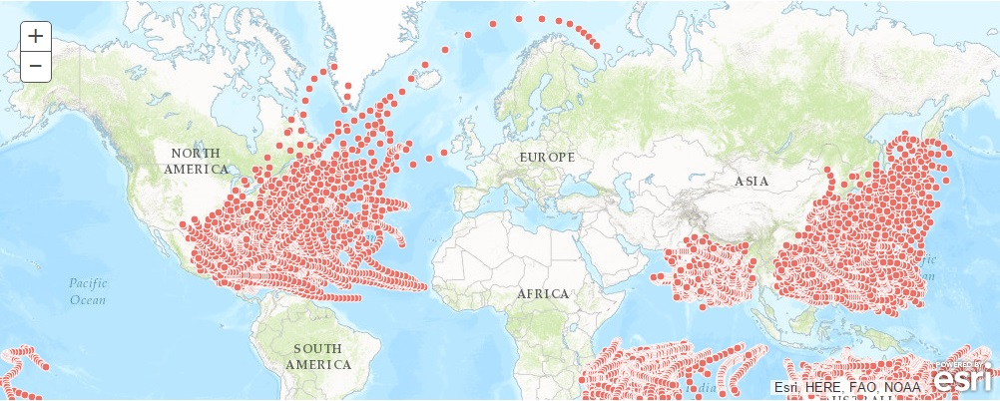

## Create a time enabled feature layer
For the GeoAnalytics desktop tools to work on this dataset, you need to convert it into a compatible GIS dataset.  Specifically for the [reconstruct tracks](https://pro.arcgis.com/en/pro-app/tool-reference/geoanalytics-desktop/reconstruct-tracks.htm) tool that will be used in ArcGIS Pro, you need the data to be represented as a time-enabled point feature layer.

To accomplish this, you can convert the pandas `DataFrame` containing point coordinates and attributes from the hurricane data into a [Spatial Enabled DataFrame](https://developers.arcgis.com/python/guide/introduction-to-the-spatially-enabled-dataframe/) object using the [`from_xy()`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.GeoAccessor.from_xy) function provided by the `arcgis.features.GeoAccessor` module that is embedded in the pandas `DataFrame` (e.g., by executing `pd.DataFrame.spatial.from_xy(hurricanes_df, x_column="longitude_merged", y_column="latitude_merged", sr=4326)`).

In this case, because you will be working with `arcpy` geoprocessing tools, it will be simpler to write the dataset out to a single CSV file, load it into a table in a file geodatabase, and use that to create an XY event layer.

*Note: you can substitue `hurricanes_df[:1000]` for `hurricanes_df` in the command below to perform the operations below on a smaller subset of the data.  A complete copy of the resulting features can be extracted from the files provided.*

In [57]:
hurricanes_merged_csv = os.path.join(data_dir, 'hurricanes_merged.csv')
hurricanes_df.to_csv(hurricanes_merged_csv, index=False)

Copy the CSV to a regular table in a file geodatabse.  Note that field types are correctly interpreted using a `schema.ini` file that is provided with the workshop files.  If this file is absent, some numeric fields might be incorrectly interpreted as text.

In [58]:
hurricanes_gdb = os.path.join(data_dir, "hurricanes.gdb")

if not os.path.exists(hurricanes_gdb):
    arcpy.management.CreateFileGDB(data_dir, "hurricanes.gdb")

hurricanes_table = os.path.join(hurricanes_gdb, "hurricanes_table")

arcpy.management.CopyRows(hurricanes_merged_csv, hurricanes_table)

<Result 'D:\\arcgis_notebooks\\hurricane_analysis\\data\\hurricanes.gdb\\hurricanes_table'>

Now make an XY Event layer using the file geodatabase table.

***Remember:*** *latitude = y, longitude = x*

In [59]:
hurricanes_layer = arcpy.management.MakeXYEventLayer(hurricanes_table,
                                                     in_x_field="longitude_merged", in_y_field="latitude_merged",
                                                     spatial_reference=arcpy.SpatialReference(4326))

Now that the complete dataset has been setup as an ArcPy Layer object, copy it to a new FeatureClass dataset in a File Geodatabase.  In that format, it may be altered and used more easily with ArcGIS Pro tools through the `arcpy` geoprocessing framework.

In [60]:
hurricane_points_fc = os.path.join(hurricanes_gdb, "hurricane_points")
arcpy.management.CopyFeatures(hurricanes_layer, hurricane_points_fc)

<Result 'D:\\arcgis_notebooks\\hurricane_analysis\\data\\hurricanes.gdb\\hurricane_points'>

With the data loaded into a conventional ArcGIS feature class, you can interact with it easily using `ArcPy` commands.

Let's take a look at some of the properties of the dataset that has been created.

In [61]:
hurricane_pts_desc = arcpy.Describe(hurricanes_layer)

print("Geometry type: {}".format(hurricane_pts_desc.shapetype))

for f in hurricane_pts_desc.fields:
    print("Field: {}, data type: {}".format(f.name, f.type))

Geometry type: Point
Field: OBJECTID, data type: OID
Field: Serial_Num, data type: String
Field: Season, data type: Integer
Field: Num, data type: Integer
Field: Basin, data type: String
Field: Sub_basin, data type: String
Field: Name, data type: String
Field: ISO_time, data type: Date
Field: Nature, data type: String
Field: Center, data type: String
Field: Track_type, data type: String
Field: Current_Basin, data type: String
Field: latitude_merged, data type: Double
Field: longitude_merged, data type: Double
Field: wind_merged, data type: Double
Field: pressure_merged, data type: Double
Field: grade_merged, data type: Double
Field: eye_dia_merged, data type: Double
Field: Shape, data type: Geometry


### Prepare a time-enabled layer

To use the ArcGIS Pro GeoAnalytics tool for reconstructing tracks from these point features, the point features must be represented as a time-enabled feature layer.  ArcGIS Pro is needed to create such a layer.  For this workshop, a template `*.lyrx` file has been provided that has time properties already enabled in it.  To apply it to the datset that has been created up to this point, all that is needed is for the layer file to be updated with properties that point to the correct dataset location.  It is pre-configured to use the `ISO_time` field to define the time properties of the layer.

Execute the cell below to make a copy of the template `*.lyrx` file, and update its properties to point to the hurricane points feature class you have created:

In [62]:
hurricane_points_time_enabled_template = os.path.join(data_dir, "hurricane_points_time_enabled_template.lyrx")
hurricane_points_time_enabled_lyrx = os.path.join(data_dir, "hurricane_points_time_enabled.lyrx")

shutil.copyfile(hurricane_points_time_enabled_template, hurricane_points_time_enabled_lyrx)

hurricane_time_enabled = arcpy.mp.LayerFile(hurricane_points_time_enabled_lyrx)

hurricane_time_enabled_layer = None

for lyr in hurricane_time_enabled.listLayers():
    lyr_props = lyr.connectionProperties
    if lyr_props['dataset'].startswith('hurricane_points'):
        lyr_props['connection_info']['database'] = hurricanes_gdb
        lyr_props['dataset'] = 'hurricane_points'
        lyr.updateConnectionProperties(lyr.connectionProperties, lyr_props)
        hurricane_time_enabled_layer = lyr

## Execute reconstruct tracks tool

The `ReconstructTracks()` tool is available in the `arcgis.gapro` desktop GeoAnalytics module. In this example, you will use this tool to aggregate the numerous points into line segments showing the tracks followed by the hurricanes. The tool creates a feature layer item as an output which can be accessed once the processing is complete.

Summary stats are recorded for all of the numerical fiealds, as well as `COUNT` and `ANY` for text fields.  This reflects similar statistical data aggregated when using GeoAnalytics with ArcGIS Enterprise to reconstruct stats from big data stores.

In [63]:
hurricane_tracks_fc = os.path.join(hurricanes_gdb, "hurricane_tracks")

if arcpy.Exists(hurricane_tracks_fc):
    arcpy.management.Delete(hurricane_tracks_fc)
    
agg_result = arcpy.gapro.ReconstructTracks(input_layer=hurricane_time_enabled_layer,
                                           out_feature_class=hurricane_tracks_fc,
                                           track_fields="Serial_Num",
                                           method="GEODESIC", 
                                           summary_fields=("Season COUNT;Season SUM;Season MEAN;Season MIN;Season MAX;Season STDDEV;Season VAR;Season RANGE;"
                                              "Num COUNT;Num SUM;Num MEAN;Num MIN;Num MAX;Num STDDEV;Num VAR;Num RANGE;"
                                              "Basin COUNT;Basin ANY;Sub_basin COUNT;Sub_basin ANY;Name COUNT;Name ANY;"
                                              "ISO_time COUNT;ISO_time ANY;Nature COUNT;Nature ANY;Center COUNT;Center ANY;"
                                              "Track_type COUNT;Track_type ANY;Current_Basin COUNT;Current_Basin ANY;"
                                              "latitude_merged COUNT;latitude_merged SUM;latitude_merged MEAN;latitude_merged MIN;latitude_merged MAX;latitude_merged STDDEV;latitude_merged VAR;latitude_merged RANGE;"
                                              "longitude_merged COUNT;longitude_merged SUM;longitude_merged MEAN;longitude_merged MIN;longitude_merged MAX;longitude_merged STDDEV;longitude_merged VAR;longitude_merged RANGE;"
                                              "wind_merged COUNT;wind_merged SUM;wind_merged MEAN;wind_merged MIN;wind_merged MAX;wind_merged STDDEV;wind_merged VAR;wind_merged RANGE;"
                                              "pressure_merged COUNT;pressure_merged SUM;pressure_merged MEAN;pressure_merged MIN;pressure_merged MAX;pressure_merged STDDEV;pressure_merged VAR;pressure_merged RANGE;"
                                              "grade_merged COUNT;grade_merged SUM;grade_merged MEAN;grade_merged MIN;grade_merged MAX;grade_merged STDDEV;grade_merged VAR;grade_merged RANGE;"
                                              "eye_dia_merged COUNT;eye_dia_merged SUM;eye_dia_merged MEAN;eye_dia_merged MIN;eye_dia_merged MAX;eye_dia_merged STDDEV;eye_dia_merged VAR;eye_dia_merged RANGE;")
                                          )

### Extract a copy of completed data

If up to this point you have been working with a subset of the data, you can extract a complete copy of resulting data to be able to proceed to the next two parts of the tutorial.

*Note: you may need to restart the notebook kernel to release any locks on the geodatabase - when you do this, be sure to re-execute the first two code cells that import modules, and define the data paths.*

In [64]:
hurricanes_gdb = os.path.join(data_dir, "hurricanes.gdb")
hurricane_tracks_fc = os.path.join(hurricanes_gdb, "hurricane_tracks")

if os.path.exists(hurricanes_gdb):
    arcpy.management.Delete(hurricanes_gdb)

hurricanes_gdb_zip = os.path.join(data_dir, "hurricanes.gdb.part1.zip")

with ZipFile(hurricanes_gdb_zip) as z:
    z.extractall(data_dir)

### Inspect the results of aggregation
The reconstruct tracks function executed earlier produced summary statistics for numeric columns (`MIN`, `MAX`, `MEAN`, `MEDIAN`, `RANGE`, `SD`, `VAR`, `SUM`), and for ordinal columns `ANY` and `COUNT`values were produced during the aggregation process.

Execute the cell below to list the fields in this dataset.

In [65]:
agg_tracks_sdf = pd.DataFrame.spatial.from_featureclass(hurricane_tracks_fc)
pprint(agg_tracks_sdf.columns, compact=True)

Index(['OBJECTID', 'Serial_Num', 'COUNT', 'COUNT_Season', 'SUM_Season',
       'MEAN_Season', 'MIN_Season', 'MAX_Season', 'SD_Season', 'VAR_Season',
       'RANGE_Season', 'COUNT_Num', 'SUM_Num', 'MEAN_Num', 'MIN_Num',
       'MAX_Num', 'SD_Num', 'VAR_Num', 'RANGE_Num', 'COUNT_Basin', 'ANY_Basin',
       'COUNT_Sub_basin', 'ANY_Sub_basin', 'COUNT_Name', 'ANY_Name',
       'COUNT_ISO_time', 'ANY_ISO_time', 'COUNT_Nature', 'ANY_Nature',
       'COUNT_Center', 'ANY_Center', 'COUNT_Track_type', 'ANY_Track_type',
       'COUNT_Current_Basin', 'ANY_Current_Basin', 'COUNT_latitude_merged',
       'SUM_latitude_merged', 'MEAN_latitude_merged', 'MIN_latitude_merged',
       'MAX_latitude_merged', 'SD_latitude_merged', 'VAR_latitude_merged',
       'RANGE_latitude_merged', 'COUNT_longitude_merged',
       'SUM_longitude_merged', 'MEAN_longitude_merged', 'MIN_longitude_merged',
       'MAX_longitude_merged', 'SD_longitude_merged', 'VAR_longitude_merged',
       'RANGE_longitude_merged', 'COUNT_wi

To get the number of hurricanes the reconstruct tracks tool identified, you can report the shape of the spatial data frame:

In [66]:
agg_tracks_sdf.shape

(12757, 87)

You can plot the tracks as graphics on a map.  First you need to instatiate a map:

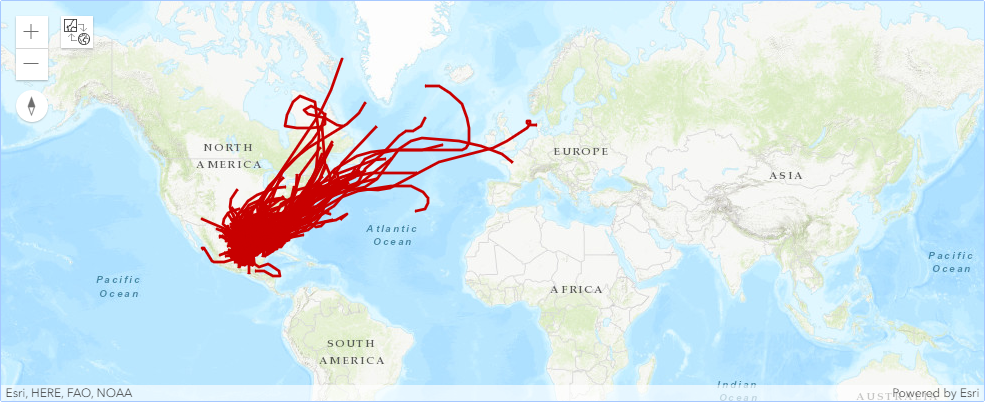

In [70]:
map = GIS().map()
map

# from IPython.display import Image
# Image('images/gm_tracks.png')

Next you can plot all or any subset of features in a spatial data frame as graphics on the map.  Plotting all of the tracks as simple graphics will not perform well.  You can filter the data frame, for example to select all tracks reconstructed for hurricanes in the Gulf of Mexico sub-basin, and plot these on an existig map widget.  Try executing the cell below - you will see the hurricane tracks drawn on the map widget produced by the code cell above:

In [71]:
agg_tracks_sdf[agg_tracks_sdf["ANY_Sub_basin"] == "GM"].copy().spatial.plot(map_widget=map)

True

# Conclusion
In this notebook, you observed how to download meteorological data over FTP from NEIC website. The data came in `176` CSV files covering `176` years ending in `2017`. You cleaned it initially using Pandas to remove unneeded header rows. You then used the Dask library to read all `176` files as a single dataset and merged data from redundant columns. This pre-processing resulted in multiple output CSV files covering a total of 348k records and 17 columns.

This data was then loaded into an ArcGIS geodatabase, converted into a point feature class, and configured as a time-enabled layer that can be used as an input layer with ArcGIS Pro's desktop GeoAnalytics tools aggregation. The reconstruct tracks tool  reduced this point dataset into hurricane tracks (lines) and during this aggregation, it calculated summary statistics for the numerical columns. The tool identified and reconstructed tracks for **`12,757`** individual hurricanes over the `176` year period.

In Part 2 of this study, you will visualize and explore this dataset to understand the prevelance, duration of hurricanes, and the communities affected by hurricanes worldwide.

In Part 3, you will analyze this aggregated result comprehensively, answer important questions such as does the intensity of hurricanes increase over time, and then draw conclusions.